In [1]:
# from models.DynaGAN_ffhq import DynaGAN
from models.DynaGAN_nada import SG2Generator

In [2]:
from models.e4e.e4e_models.encoders.psp_encoders import Encoder4Editing
from models.e4e.e4e_models.psp import get_keys

In [3]:
import numpy as np
import torch
import torchvision
import os

toPIL = torchvision.transforms.ToPILImage()


In [4]:
from torchvision import transforms

In [5]:
from PIL import Image

In [6]:
def tensor2im(var):
    var = var.cpu().detach().transpose(0, 2).transpose(0, 1).numpy()
    var = ((var + 1) / 2)
    var[var < 0] = 0
    var[var > 1] = 1
    var = var * 255
    return Image.fromarray(var.astype('uint8'))

In [120]:
class DynaGANOptions:
    device = "cuda"
    frozen_gen_ckpt = "/kuacc/users/aanees20/DynaGAN/pretrained_models/ffhq.pt"
    size = 1024
    stylegan_size = 1024
    train_gen_ckpt = "/kuacc/users/aanees20/DynaGAN/output_clip_nada_disc_contr/checkpoint/final.pt"
    c_dim = 9
    no_scaling = False
    no_residual = False
    phase = None
    e4e_checkpoint_path = "/kuacc/users/aanees20/DynaGAN/pretrained_models/e4e_ffhq_encode.pt"
    lambda_id = 0
    clip_models = ["ViT-B/32", "ViT-B/16"]
    clip_model_weights = [1.0, 1.0]
    lambda_direction = 1.0
    lambda_patch = 0.0
    lambda_global = 0.0
    lambda_manifold = 0.0
    lambda_texture = 0.0
    lambda_contrast = 0
    batch = 4
    truncation = 0.7

In [121]:
args = DynaGANOptions

In [122]:
encoder = Encoder4Editing(50, 'ir_se', args).to(args.device)
print('Loading e4e over the pSp framework from checkpoint: {}'.format(args.e4e_checkpoint_path))
ckpt = torch.load(args.e4e_checkpoint_path, map_location='cpu')
encoder.load_state_dict(get_keys(ckpt, 'encoder'), strict=True)

Loading e4e over the pSp framework from checkpoint: /kuacc/users/aanees20/DynaGAN/pretrained_models/e4e_ffhq_encode.pt


<All keys matched successfully>

In [123]:
# image_path = "/datasets/ffhq/images1024x1024/"
# image_path = "/datasets/CelebAMask-HQ/CelebA-HQ-img"
image_path = "/kuacc/users/aanees20/domain-expansion/outputs/"

In [124]:
print('Load finetuned generator')

target_ckpt = torch.load(args.train_gen_ckpt, map_location=args.device)

Load finetuned generator


In [125]:
# style_latent = target_ckpt["style_latent"]
latent_avg = target_ckpt["latent_avg"].type(torch.FloatTensor).to(args.device)
# c_dim = target_ckpt['c_dim']
is_dynagan = target_ckpt['is_dynagan']

In [126]:
################
embed_mlp = False#########
################
generator = SG2Generator(args.train_gen_ckpt, img_size=args.size, c_dim=9, no_scaling=args.no_scaling, no_residual=args.no_residual, is_dynagan=is_dynagan, embed_mlp=embed_mlp).to(args.device)
generator.eval()
# conv1.conv.hypernet.out_channel_estimator.weight
n_latents =  generator.generator.n_latent

In [69]:
latent_mean=latent_avg.unsqueeze(0).repeat(18,1).unsqueeze(0).repeat(4,1,1)

In [70]:
latent_mean.shape

torch.Size([4, 18, 512])

In [17]:
# names = [os.path.join(image_path, path) for path in os.listdir(image_path)]

In [18]:
# names[0]

In [19]:
img_transforms = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])

In [20]:
# img_tensor = img_transforms(img_cond).unsqueeze(0)

In [21]:
# img_tensor.shape

In [20]:
from torch import nn

In [21]:
upsample = nn.Upsample(scale_factor=7)
avg_pool = nn.AvgPool2d(kernel_size=1024 // 32)

In [22]:
face_pool = torch.nn.AdaptiveAvgPool2d((512, 512))

In [25]:
# import json

In [26]:
# simi = []
# max_sim = {"sim": 0, "path": None}
# for name in names:
#     img = Image.open(name)
#     img_tensor = img_transforms(img).unsqueeze(0)
# #     img_embed = clip_model.encode_image(img_preprocess).to(torch.float32).unsqueeze(0)
# #     txt_embed = txt_embed_original
#     image = avg_pool(upsample(img_tensor))
#     similarity = 1 - clip_model(image.cuda(),text_original)[0] / 100
#     simi.append(similarity.item())
#     if max_sim["sim"] < similarity:
#         max_sim["sim"] = similarity.item()
#         max_sim["path"] = name
#         with open("clip_sim.json", "w") as write_file:
#             json.dump(max_sim, write_file, indent=4)
        

In [23]:
import clip

In [24]:
clip_model, clip_preprocess = clip.load("ViT-B/16", device = args.device)

In [25]:
batch_size = 4

In [26]:
sample_z = torch.randn(args.batch, 512, device=args.device)

In [27]:
w_styles = generator.style([sample_z])[0]
# w_styles = latent_mean

output_latents = args.truncation * (w_styles - latent_avg) + latent_avg
output_latents = output_latents.unsqueeze(1).repeat(1, n_latents, 1)

In [29]:
output_latents_2.shape

torch.Size([4, 18, 512])

In [34]:
# w_styles_avg = generator.style([sample_z*0])[0]


In [57]:
# txt = "this person is smiling"

# text_original = clip.tokenize(txt).to(args.device)

# with torch.no_grad():
#     txt_embed_original = clip_model.encode_text(text_original)
# txt_embed_original = txt_embed_original.to(args.device).float()

# txt_embed_original = txt_embed_original.repeat(batch_size,1)

# domain_label = txt_embed_original

In [260]:
# names = [image_path+"dim_457/00087.jpg"]
names = ["/kuacc/users/aanees20/DynaGAN/target_data/nada_data_2/043.jpg"]
img_cond = Image.open(names[0])

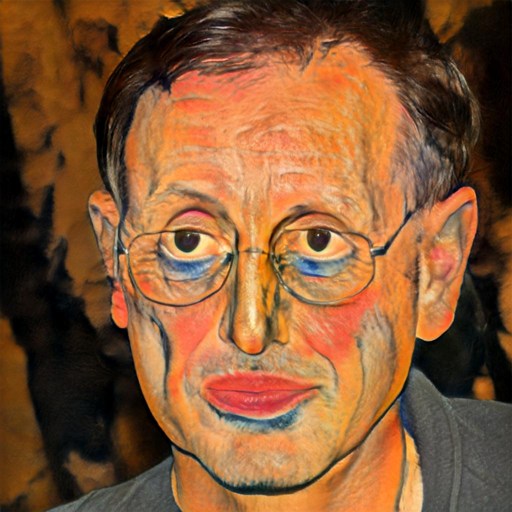

In [261]:
img_cond.resize((512,512))

In [262]:
img_256 = img_cond.resize((256,256))
img_256 = img_transforms(img_256).unsqueeze(0).cuda()

In [263]:
ZP_target_latent = encoder(img_256)

In [264]:
output_latents_2 = output_latents.clone().detach()
interp = 0.5
output_latents_2[:, 7:, :] = (1-interp) * output_latents_2[:, 7:, :] + interp * ZP_target_latent[:, 7:, :]

In [265]:
w2 = [output_latents_2]
w1 = [output_latents]

In [266]:
img_preprocess = clip_preprocess(img_cond).unsqueeze(0).cuda()

In [267]:
with torch.no_grad():
    img_embed = clip_model.encode_image(img_preprocess).to(torch.float32)
img_embed = img_embed.repeat(batch_size,1)

In [268]:
# domain_label = txt_embed_original
domain_label = img_embed

In [269]:
face_pool = torch.nn.AdaptiveAvgPool2d((256, 256))

In [240]:
txt = "dark hair"

text_original = clip.tokenize(txt).to(args.device)

with torch.no_grad():
    txt_embed_original = clip_model.encode_text(text_original)
txt_embed_original = txt_embed_original.to(args.device).float()

txt_embed_original = txt_embed_original.repeat(batch_size,1)

domain_label = txt_embed_original

In [270]:
with torch.no_grad():
    outputs2 = generator(w2, input_is_latent=True, randomize_noise=False, domain_labels=[domain_label],domain_is_latents=not embed_mlp)[0]

    outputs1 = generator(w1, input_is_latent=True, randomize_noise=False, domain_labels=[domain_label],domain_is_latents=not embed_mlp)[0]

    outputs_fixed = generator(w1, input_is_latent=True, randomize_noise=False)[0]

    outputs_fixed_2 = generator(w2, input_is_latent=True, randomize_noise=False)[0]

In [271]:
ind = 0
fixed_1 = face_pool(outputs_fixed[ind])
fixed_stylemix = face_pool(outputs_fixed_2[ind])
outputs_1 = face_pool(outputs1[ind])
outputs_stylemix = face_pool(outputs2[ind])
img = torch.cat([img_256[0], fixed_1, outputs_1, outputs_stylemix, fixed_stylemix], dim=2)
# img = torch.cat([fixed_1, outputs_1], dim=2)

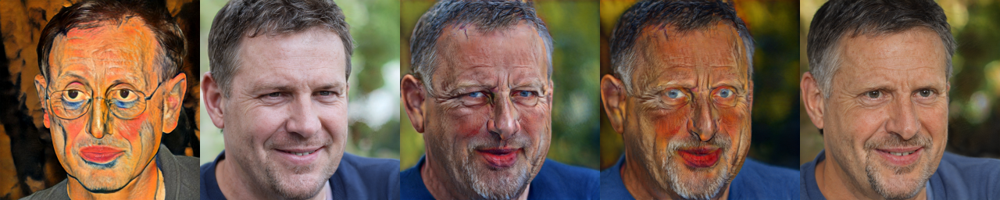

In [272]:
tensor2im(img)

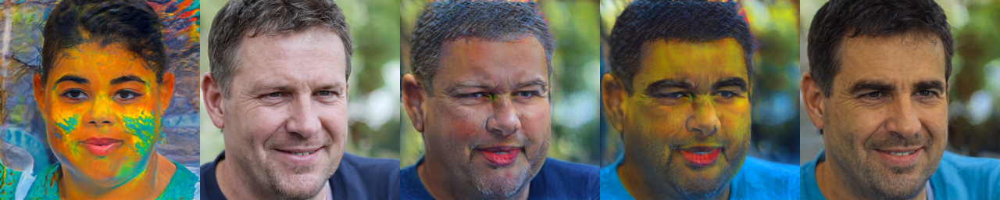

In [203]:
tensor2im(img)

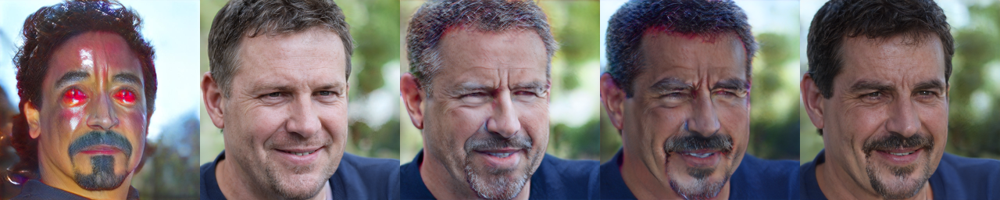

In [119]:
tensor2im(img)

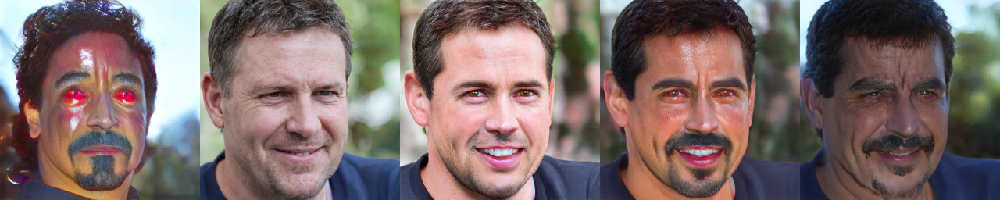

In [102]:
tensor2im(img)

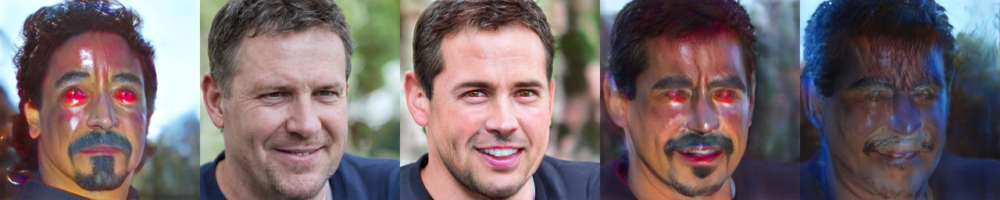

In [73]:
tensor2im(img)

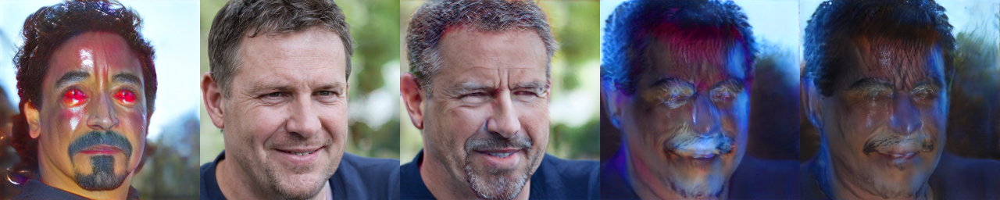

In [61]:
tensor2im(img)

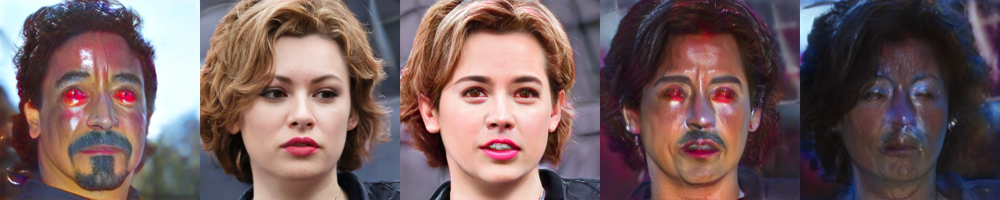

In [56]:
tensor2im(img)

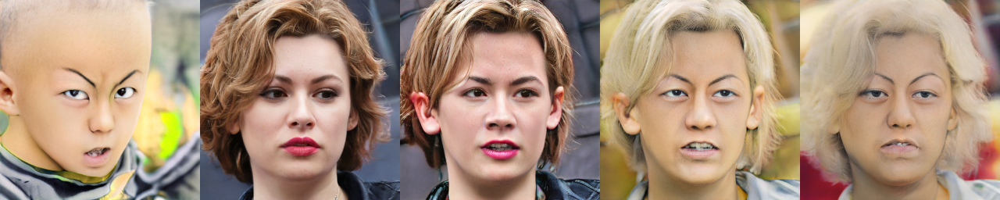

In [41]:
tensor2im(img)

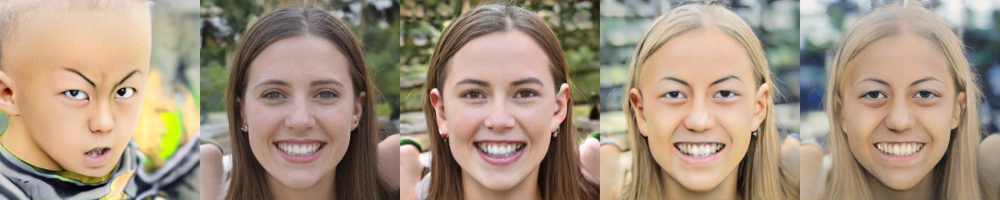

In [103]:
tensor2im(img)

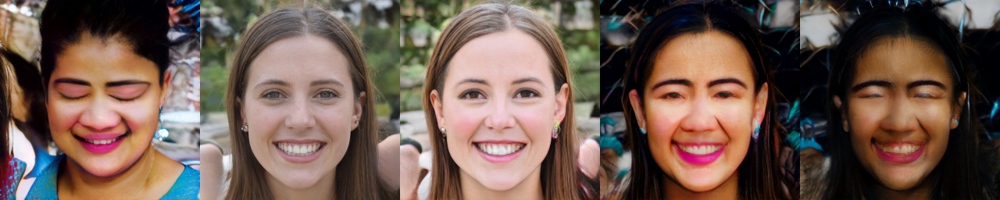

In [90]:
tensor2im(img)

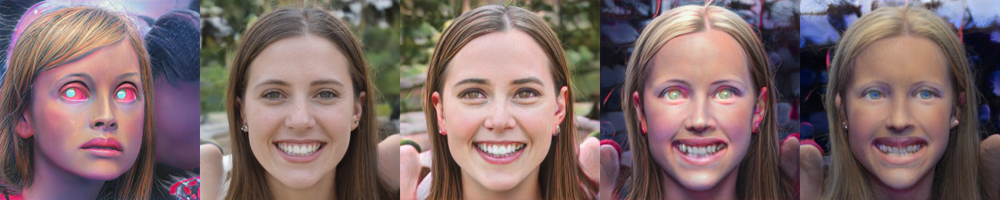

In [77]:
tensor2im(img)

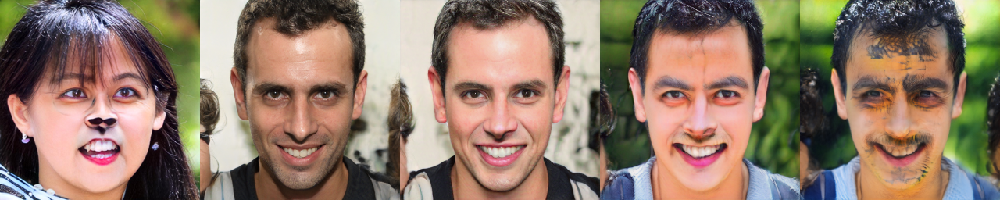

In [137]:
tensor2im(img)

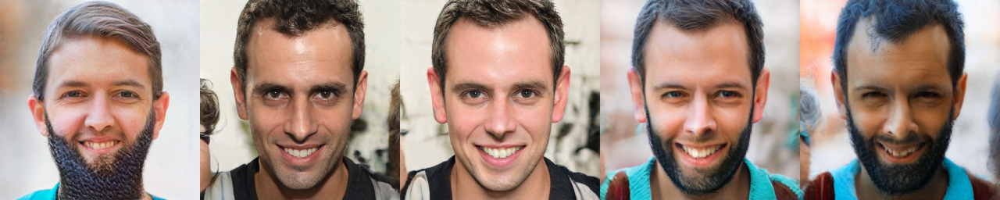

In [119]:
tensor2im(img)

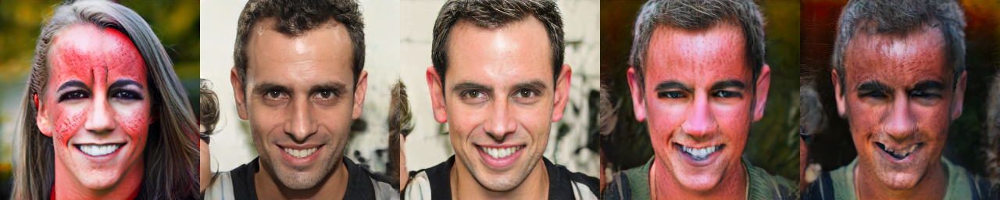

In [101]:
tensor2im(img)

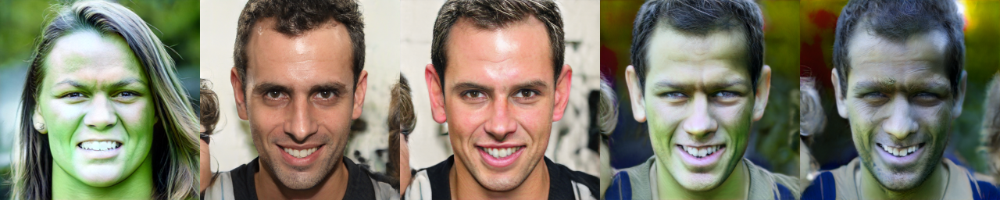

In [83]:
tensor2im(img)

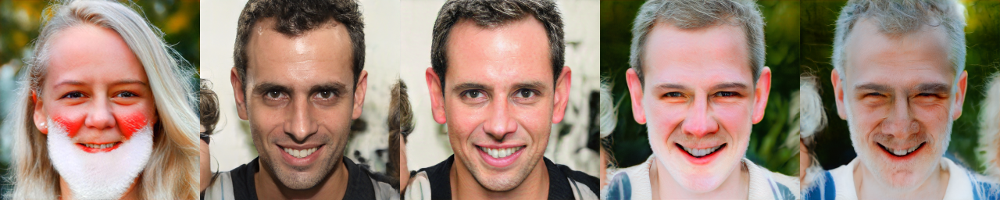

In [65]:
tensor2im(img)

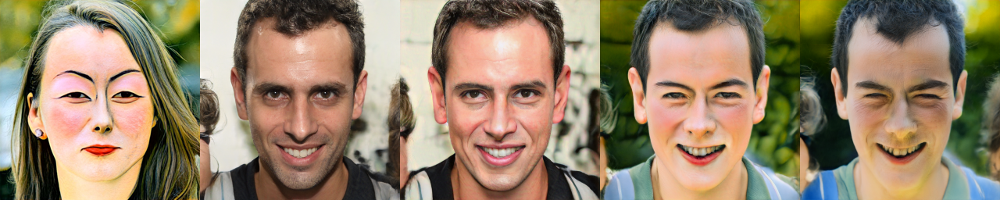

In [47]:
tensor2im(img)